In [1]:
import scipy.io
import numpy as np
import scipy as sp
from scipy import signal
import cupy as cp
import matplotlib.pyplot as plt
import os
import time
#67135780

path = "./Parametric_tests/Test_13/rec/"

# Evaluation of beamforming grid: SSI


## Homogeneous experiment

### Debug

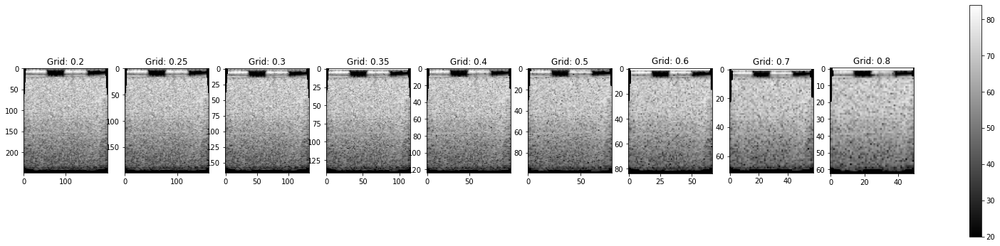

In [2]:
# Plot b-modes
grid = [0.2, 0.25, 0.3, 0.35, 0.4, 0.5, 0.6, 0.7, 0.8]
datatype = 'bmode'
iFactor = 5
iOrder = 2
idx = 40

# Load data
data = []
for i in grid:
    dataset = sp.io.loadmat(path + 'bmode' + '_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '.mat') 
    din = dataset["data"]                        
    data.append(din)                        


# Print
dB_range = [20, 84] 
norm = plt.Normalize(dB_range[0], dB_range[1], True)
ax = [] * len(grid)
fig, ax = plt.subplots(1, len(grid), figsize=(28, 6))
for i in range(len(grid)):
    pcm=ax[i].imshow(data[i], cmap='gray', norm=norm)
    ax[i].set_title('Grid: ' + str(grid[i]))

fig.colorbar(pcm, ax=ax)


(142, 115, 115)
False


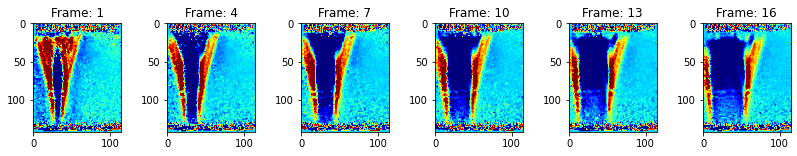

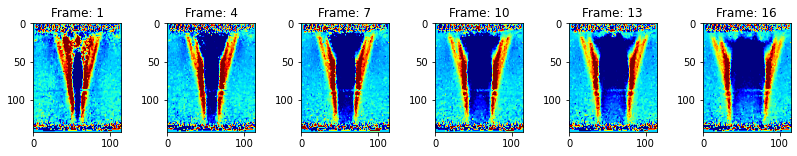

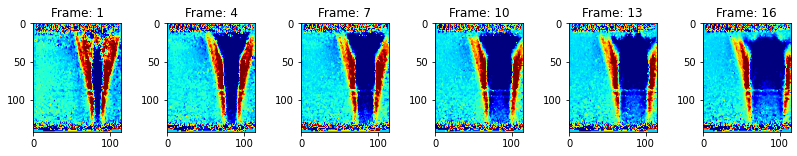

In [3]:
# Print shear maps (for debug)
def DrawShearWaveFrames(data, Vrange, frames):
    data = np.clip(data, Vrange[0], Vrange[1])
    norm = plt.Normalize(Vrange[0], Vrange[1], True)
    ax = [] * len(frames)
    fig, ax = plt.subplots(1, 6, figsize=(14, 2))
    #frames = [1, 4, 7, 10, 13, 16]
    for i in range(len(frames)):
        ax[i].imshow(data[:, :, frames[i]], cmap='jet', norm=norm)
        ax[i].set_title('Frame: ' + str(frames[i]))
    return  

# Load data
dataset = sp.io.loadmat(path + 'swd_A_grid' + str(0.35) + '_iFactor' + str(5) + '_iOrder' + str(2) + '_id_' + str(40) + '.mat') 
swdf_A = dataset["data"] 

dataset = sp.io.loadmat(path + 'swd_B_grid' + str(0.35) + '_iFactor' + str(5) + '_iOrder' + str(2) + '_id_' + str(40) + '.mat') 
swdf_B = dataset["data"]  

dataset = sp.io.loadmat(path + 'swd_C_grid' + str(0.35) + '_iFactor' + str(5) + '_iOrder' + str(2) + '_id_' + str(40) + '.mat') 
swdf_C = dataset["data"]  

print(swdf_A.shape)

DrawShearWaveFrames(data=swdf_A[...], Vrange=[-1e-3, 2e-3], frames=[1, 4, 7, 10, 13, 16])
DrawShearWaveFrames(data=swdf_B[...], Vrange=[-1e-3, 2e-3], frames=[1, 4, 7, 10, 13, 16])
DrawShearWaveFrames(data=swdf_C[...], Vrange=[-1e-3, 2e-3], frames=[1, 4, 7, 10, 13, 16])

print(np.array_equal(swdf_B, swdf_B))

In [4]:
# Debug individual SWS maps
# Load datasets SSI
ifactor = 5
iOrder = 2
idx = 40
grids = [0.2, 0.25, 0.3, 0.35, 0.4, 0.5, 0.6, 0.7, 0.8]
sws_maps = []
SWV_A = []
SWV_B = []
SWV_C = []

for i in grids:
    # Load sws maps
    dataset = sp.io.loadmat(path + 'sws_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '.mat') 
    din = dataset["data"]     
    sws_maps.append(din) 
    
    # Load intermediate results
    dataset = sp.io.loadmat(path + 'sws_A_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '.mat') 
    din = dataset["data"]     
    SWV_A.append(din) 
    
    dataset = sp.io.loadmat(path + 'sws_B_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '.mat') 
    din = dataset["data"]     
    SWV_B.append(din) 
    
    dataset = sp.io.loadmat(path + 'sws_C_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '.mat')  
    din = dataset["data"]     
    SWV_C.append(din)  

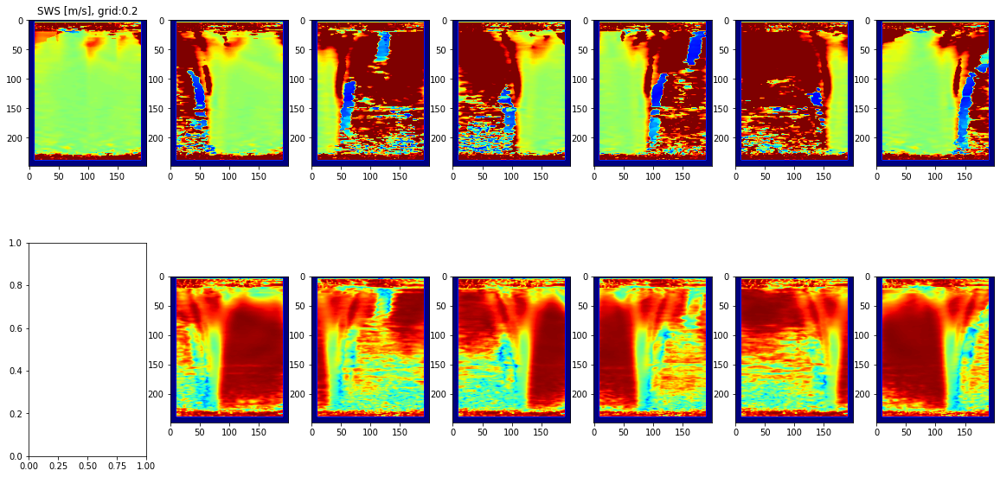

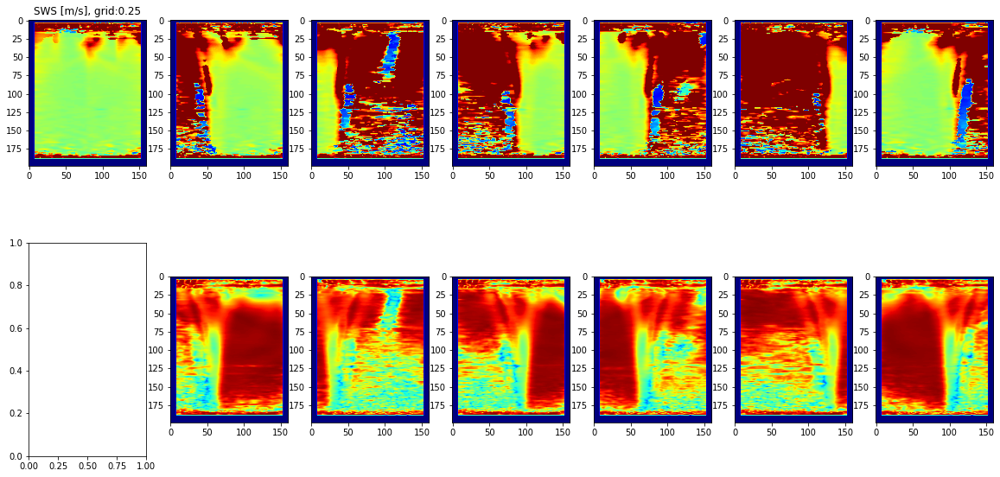

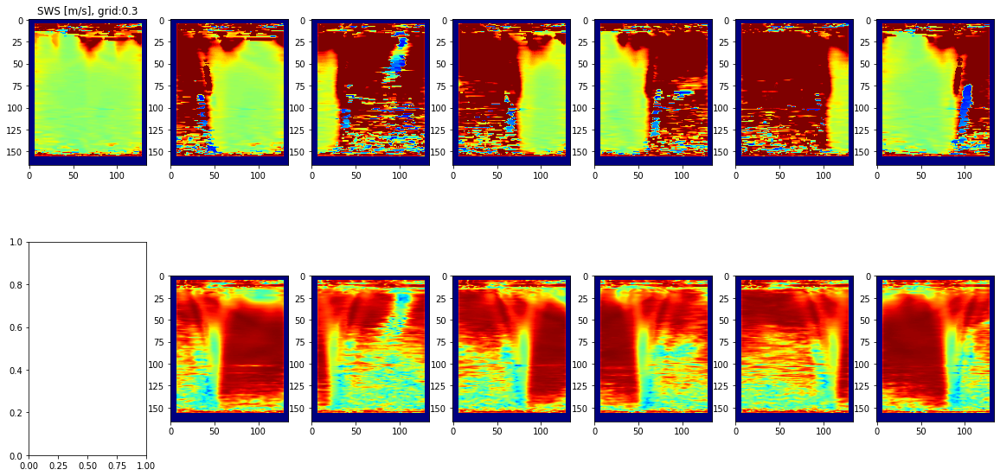

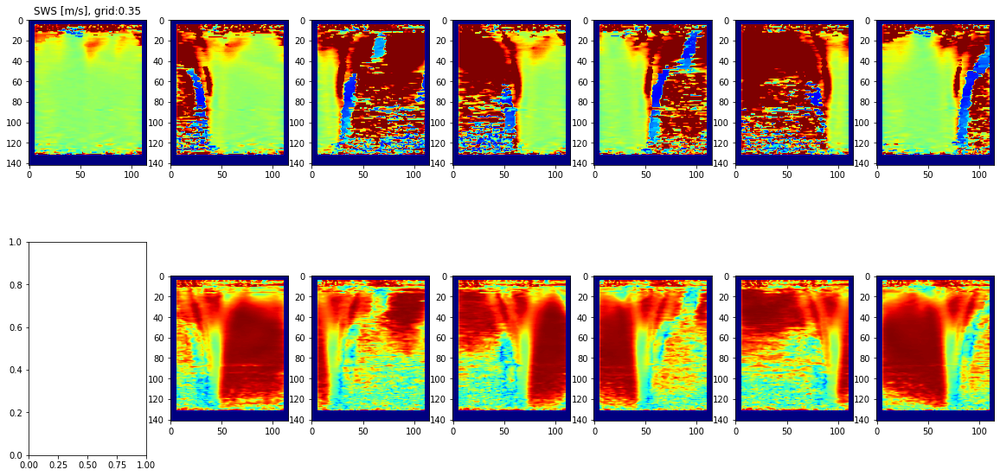

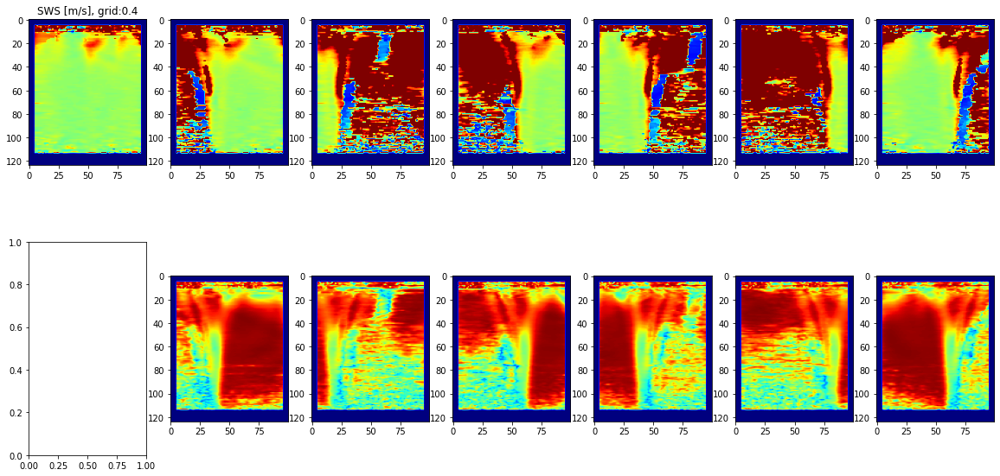

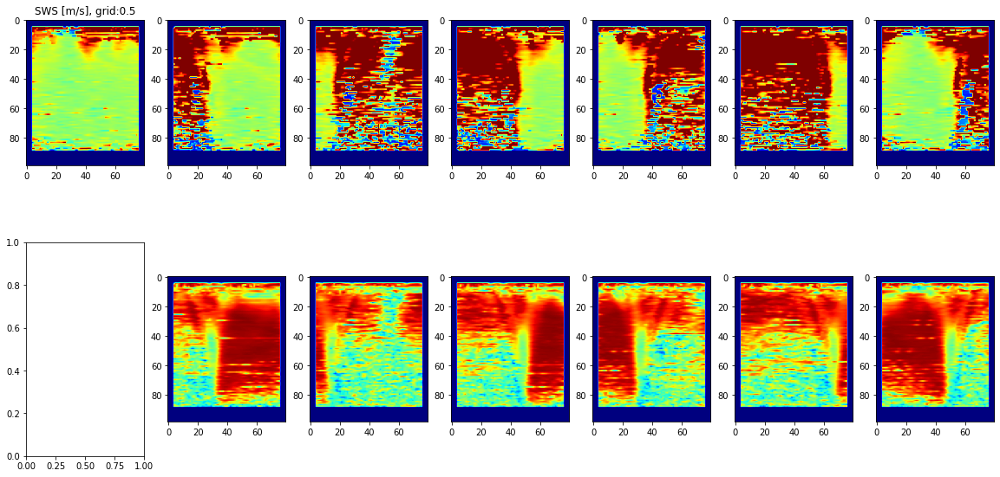

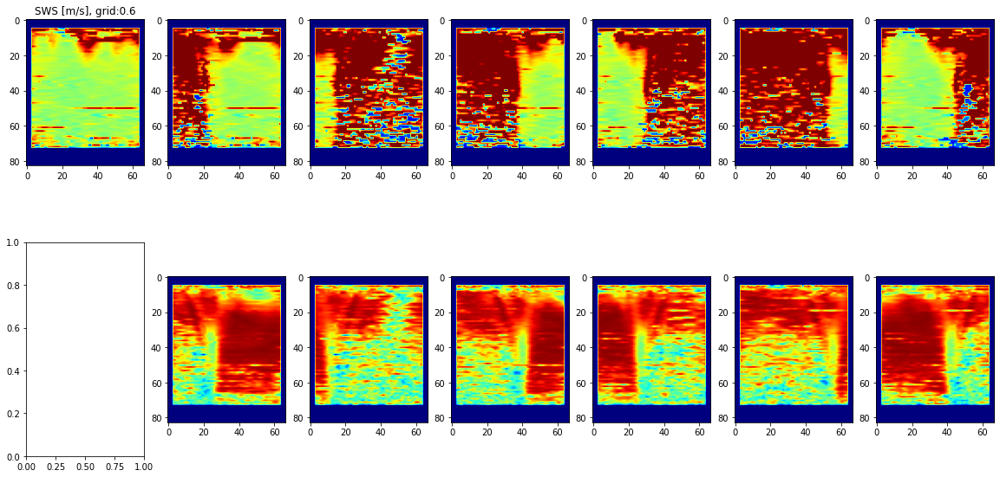

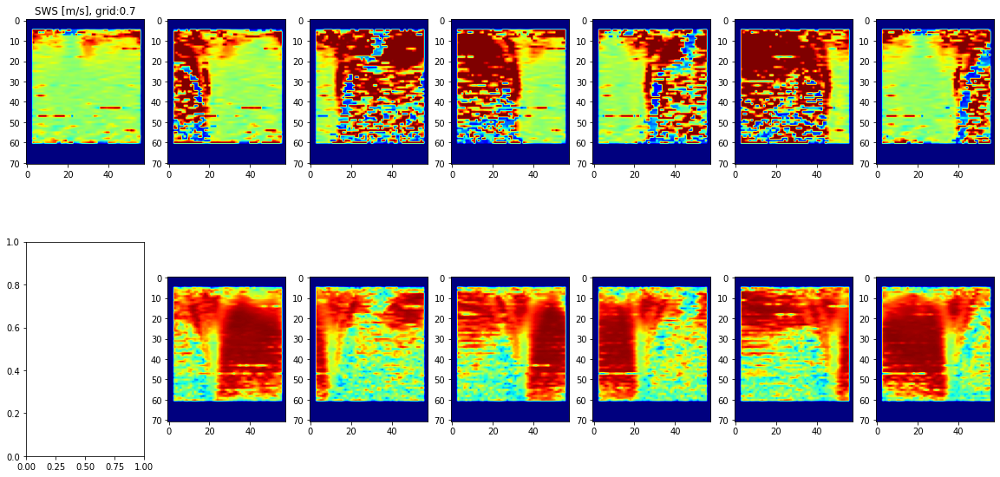

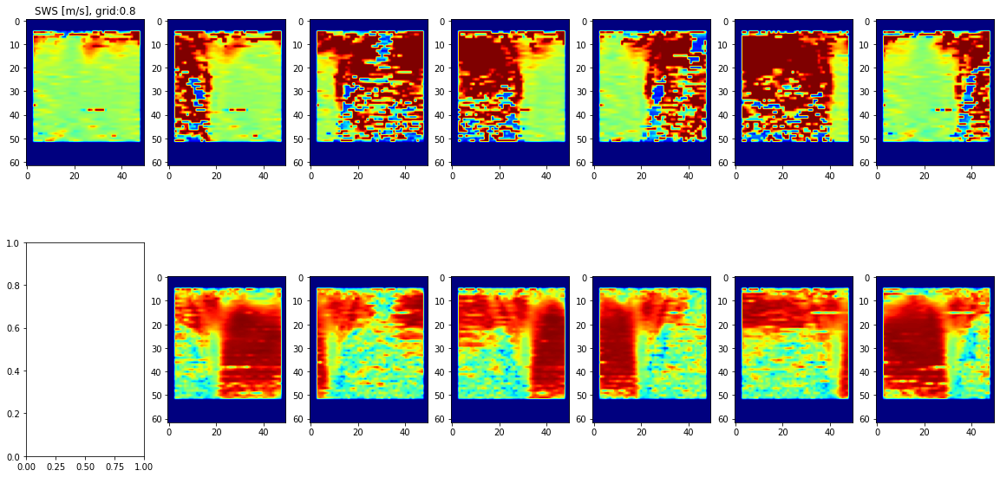

In [5]:
#Visualize the results
norm_sws = plt.Normalize(0, 4.5, True)
norm_r   = plt.Normalize(0, 1, True)


for i in range(len(sws_maps)):
    fig, axs = plt.subplots(nrows=2, ncols=7, figsize=(20, 10))
    axs[0][0].imshow(np.squeeze(sws_maps[i]), cmap='jet', norm=norm_sws)
    axs[0][0].set_title('SWS [m/s], grid:' + str(grids[i]))
    
    axs[0][1].imshow(np.squeeze(SWV_A[i][0, 0, ...]), cmap='jet', norm=norm_sws)
    axs[0][2].imshow(np.squeeze(SWV_A[i][0, 1, ...]), cmap='jet', norm=norm_sws)
    axs[0][3].imshow(np.squeeze(SWV_B[i][0, 0, ...]), cmap='jet', norm=norm_sws)
    axs[0][4].imshow(np.squeeze(SWV_B[i][0, 1, ...]), cmap='jet', norm=norm_sws)
    axs[0][5].imshow(np.squeeze(SWV_C[i][0, 0, ...]), cmap='jet', norm=norm_sws)
    axs[0][6].imshow(np.squeeze(SWV_C[i][0, 1, ...]), cmap='jet', norm=norm_sws)
    
    axs[1][1].imshow(np.squeeze(SWV_A[i][1, 0, ...]), cmap='jet', norm=norm_r)
    axs[1][2].imshow(np.squeeze(SWV_A[i][1, 1, ...]), cmap='jet', norm=norm_r)
    axs[1][3].imshow(np.squeeze(SWV_B[i][1, 0, ...]), cmap='jet', norm=norm_r)
    axs[1][4].imshow(np.squeeze(SWV_B[i][1, 1, ...]), cmap='jet', norm=norm_r)
    axs[1][5].imshow(np.squeeze(SWV_C[i][1, 0, ...]), cmap='jet', norm=norm_r)
    axs[1][6].imshow(np.squeeze(SWV_C[i][1, 1, ...]), cmap='jet', norm=norm_r)  

In [43]:
#Analyze results
# Define ROI
roi_base = np.array([[50, 125], [125, 175]])  # for 0.2 grid
base_grid = 0.2

# Find ROIs
grids = np.array(grid)
scales = 0.2 / grids
roi_c = np.zeros((len(grid), 2, 2))

for i in range(len(grid)):
    roi_c[i, ...] = roi_base * scales[i]

roi_c = roi_c.astype(int)    
#print(roi_c)  

# Calc average SNR in ROIs
avgSNR = [0] * len(grid)
for i in range(len(grid)):
    y1 = int(roi_c[i, 0, 0])
    y2 = int(roi_c[i, 0, 1])
    x1 = int(roi_c[i, 1, 0])
    x2 = int(roi_c[i, 1, 1])
    d = np.array(data[i])
    avgSNR[i] = np.mean(d[y1:y2, x1:x2])

print(avgSNR)    

[44.145084, 42.32899, 39.288723, 39.882412, 39.901405]


(249, 200)
(124, 100)
(83, 67)
(62, 50)


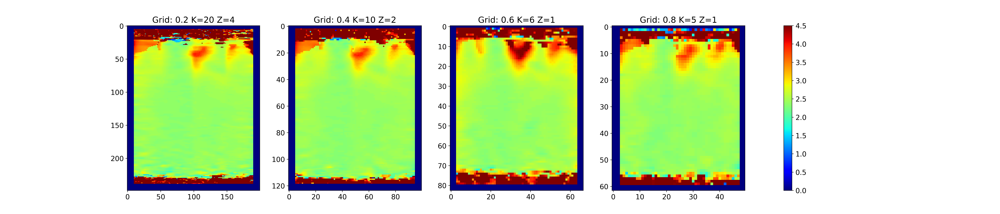

In [72]:
# Plot SWS maps
grid = [0.2, 0.25, 0.3, 0.35, 0.4, 0.5, 0.6, 0.7, 0.8]
grid = [0.2, 0.4, 0.6, 0.8]
datatype = 'sws'
iFactor = 5
iOrder = 2
idx = 40

# Load data
data = []
for i in grid:
    dataset = sp.io.loadmat(path + datatype + '_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '.mat') 
    din = dataset["data"] 
    print(din.shape)
    data.append(din)  
    
# Calc kernel sizes
gridStep = np.array(grid)
K = 20*0.2/gridStep
K = K.astype(int)

Z =  4.0*0.2/gridStep
Z = Z.astype(int)
    
# Print
SWS_range = [0, 4.5] 
norm = plt.Normalize(SWS_range[0], SWS_range[1], True)
ax = [] * len(grid)
fig, ax = plt.subplots(1, len(grid), figsize=(28, 6))
for i in range(len(grid)):
    pcm=ax[i].imshow(data[i], cmap='jet', norm=norm)
    ax[i].set_title('Grid: ' + str(grid[i]) + ' K=' + str(K[i]) + ' Z=' + str(Z[i]))

fig.colorbar(pcm, ax=ax)

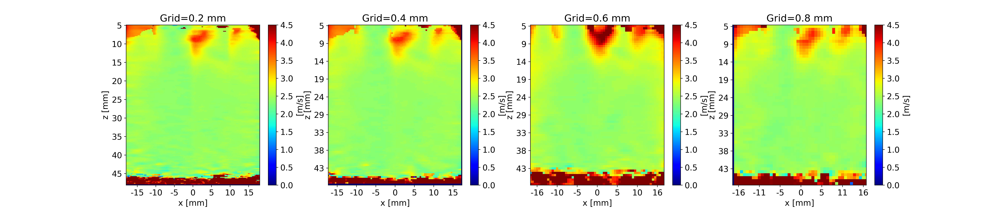

In [73]:
# Presentation for manuscript
%matplotlib widget
plt.rc("figure", dpi=400)
plt.rcParams.update({'font.size': 14})

# Settings
# Assign ticks
y_grid = 5  #[mm] -- how to arrange ticks
x_grid = 5  #[mm]
grid_step = [0.2, 0.4, 0.6, 0.8]
norm_sws = plt.Normalize(0, 4.5, True)

# Print and format images
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(24, 5))

for i in range(4):
    z0 = int(24*0.2/grid_step[i])
    z1 = int(240*0.2/grid_step[i])
    pcm = axs[i].imshow(np.squeeze(data[i][z0:z1, :]), cmap='jet', norm=norm_sws)
    axs[i].set_title('Grid=' + str(grid_step[i]) + ' mm')
    fig.colorbar(pcm, ax=axs[i], label='[m/s]')

    im_dim = data[i][z0:z1, :].shape

    yticks  = np.arange(0, im_dim[0]-1, int(np.round(y_grid / grid_step[i]))) 
    yticks_labels = (yticks * grid_step[i]) + 5
    yticks_labels = [str(int(x)) for x in yticks_labels]

    m = int(im_dim[1]//2)
    a = np.arange(m, 0, -int(np.ceil(x_grid / grid_step[i])))
    b = np.arange(m, im_dim[1]-1, int(np.ceil(x_grid / grid_step[i])))
    xticks = np.concatenate((a[1:], b))
    xticks_labels = (xticks - m) * grid_step[i]
    xticks_labels = [str(int(x)) for x in xticks_labels]

    x0 = int(10*0.2/grid_step[i])
    x1 = int(190*0.2/grid_step[i]) 
    axs[i].set_xlim([x0,x1])    

    axs[i].set_xticks(xticks)
    axs[i].set_xticklabels(xticks_labels) 
    axs[i].set_yticks(yticks)
    axs[i].set_yticklabels(yticks_labels)

    # Set labels
    axs[i].set_xlabel('x [mm]')
    axs[i].set_ylabel('z [mm]')
    


In [7]:
#Analyze results
# Define ROI
roi_base = np.array([[75, 150], [100, 175]])  # for 0.2 grid
base_grid = 0.2

# Find ROIs
grids = np.array(grid)
scales = 0.2 / grids
roi_c = np.zeros((len(grid), 2, 2))

for i in range(len(grid)):
    roi_c[i, ...] = roi_base * scales[i]

roi_c = roi_c.astype(int)    
#print(roi_c)  

# Calc average SNR in ROIs
avgSNR = [0] * len(grid)
avgSWS = [0] * len(grid)
for i in range(len(grid)):
    y1 = int(roi_c[i, 0, 0])
    y2 = int(roi_c[i, 0, 1])
    x1 = int(roi_c[i, 1, 0])
    x2 = int(roi_c[i, 1, 1])
    d = np.array(data[i])
    avgSNR[i] = np.std(d[y1:y2, x1:x2])
    avgSWS[i] = np.mean(d[y1:y2, x1:x2])

avgSNR = np.asarray(avgSNR)
avgSNR = 20 * np.log10(avgSWS/avgSNR)
print(grid)
print(avgSWS)  
print(avgSNR)    

[0.2, 0.25, 0.3, 0.35, 0.4, 0.5, 0.6, 0.7, 0.8]
[2.4419700333195573, 2.450459454506039, 2.4817980479837876, 2.4548428675138525, 2.446749181714659, 2.446672813604948, 2.474326766442144, 2.4538127946912933, 2.4582295450179035]
[31.86994914 31.34038504 29.35537327 30.61711134 31.2825861  31.39719986
 29.62618661 31.03968976 29.93063633]


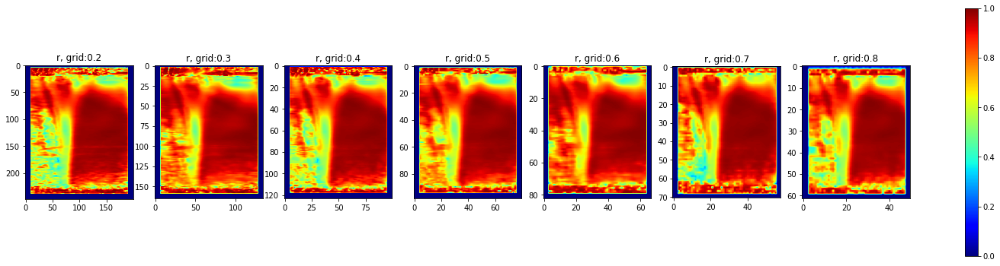

In [17]:
# Plot SWS r maps
grid = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
datatype = 'sws'
iFactor = 5
iOrder = 2
idx = 40

SWV_A = []

# Load
for i in grid:
    # Load intermediate results
    dataset = sp.io.loadmat(path + 'sws_A_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '.mat') 
    din = dataset["data"]     
    SWV_A.append(din) 
    
    
#Visualize the results
norm_r   = plt.Normalize(0, 1, True)

fig, axs = plt.subplots(nrows=1, ncols=len(grid), figsize=(26, 6))
for i in range(len(grid)):
    pcm = axs[i].imshow(np.squeeze(SWV_A[i][1, 0, :, :]), cmap='jet', norm=norm_r)
    axs[i].set_title('r, grid:' + str(grid[i]))

fig.colorbar(pcm, ax=axs)

In [20]:
#Analyze results
data = []
for i in range(len(SWV_A)):
    data.append(SWV_A[i][1, 1, ...])

# Define ROI
roi_base = np.array([[75, 150], [100, 175]])  # for 0.2 grid
base_grid = 0.2

# Find ROIs
grids = np.array(grid)
scales = 0.2 / grids
roi_c = np.zeros((len(grid), 2, 2))

for i in range(len(grid)):
    roi_c[i, ...] = roi_base * scales[i]

roi_c = roi_c.astype(int)    
#print(roi_c)  

# Calc average SNR in ROIs
avg_r = [0] * len(grid)
for i in range(len(grid)):
    y1 = int(roi_c[i, 0, 0])
    y2 = int(roi_c[i, 0, 1])
    x1 = int(roi_c[i, 1, 0])
    x2 = int(roi_c[i, 1, 1])
    d = np.array(data[i])
    avg_r[i] = np.mean(d[y1:y2, x1:x2])

print(grid)
print(avg_r)    

[0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
[0.9266146757154586, 0.9055686044064473, 0.9369407613710504, 0.9095460512646026, 0.9116373536167146, 0.9435608054523894, 0.9129558907814792]


### Inclusion study / SSI

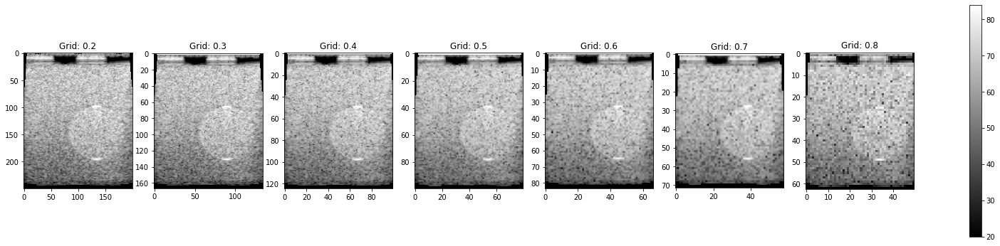

In [21]:
# Plot b-modes
grid = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
datatype = 'bmode'
iFactor = 5
iOrder = 2
idx = 41

# Load data
data = []
for i in grid:
    dataset = sp.io.loadmat(path + 'bmode' + '_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '.mat') 
    din = dataset["data"]                        
    data.append(din)                        


# Print
dB_range = [20, 84] 
norm = plt.Normalize(dB_range[0], dB_range[1], True)
ax = [] * len(grid)
fig, ax = plt.subplots(1, len(grid), figsize=(28, 6))
for i in range(len(grid)):
    pcm=ax[i].imshow(data[i], cmap='gray', norm=norm)
    ax[i].set_title('Grid: ' + str(grid[i]))

fig.colorbar(pcm, ax=ax)

(249, 200)
(124, 100)
(83, 67)
(62, 50)


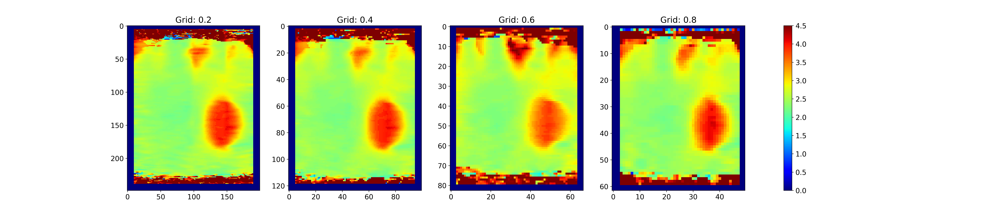

In [68]:
# Plot SWS maps
#grid = [0.2, 0.25, 0.3, 0.35, 0.4]
#grid = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
grid = [0.2, 0.4, 0.6, 0.8]
datatype = 'sws'
iFactor = 5
iOrder = 2
p = 20
idx = 42

# Load data
data = []
for i in grid:
    dataset = sp.io.loadmat(path + datatype + '_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '_p'+str(p)+'.mat') 
    din = dataset["data"] 
    print(din.shape)
    data.append(din)   
    
# Print
SWS_range = [0, 4.5] 
norm = plt.Normalize(SWS_range[0], SWS_range[1], True)
ax = [] * len(grid)
fig, ax = plt.subplots(1, len(grid), figsize=(28, 6))
for i in range(len(grid)):
    pcm=ax[i].imshow(data[i], cmap='jet', norm=norm)
    ax[i].set_title('Grid: ' + str(grid[i]))

fig.colorbar(pcm, ax=ax)

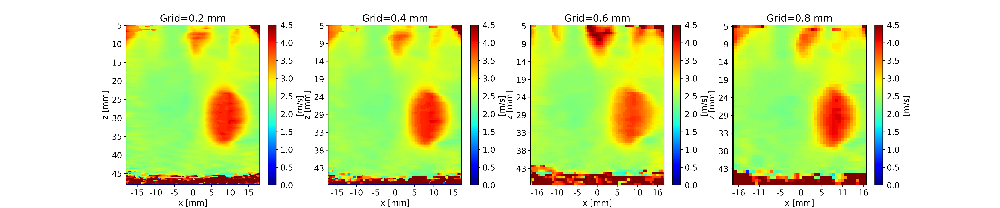

In [69]:
# Presentation for manuscript
%matplotlib widget
plt.rc("figure", dpi=400)

# Settings
# Assign ticks
y_grid = 5  #[mm] -- how to arrange ticks
x_grid = 5  #[mm]
grid_step = [0.2, 0.4, 0.6, 0.8]
norm_sws = plt.Normalize(0, 4.5, True)

# Print and format images
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(24, 5))

for i in range(4):
    z0 = int(24*0.2/grid_step[i])
    z1 = int(240*0.2/grid_step[i])
    pcm = axs[i].imshow(np.squeeze(data[i][z0:z1, :]), cmap='jet', norm=norm_sws)
    axs[i].set_title('Grid=' + str(grid_step[i]) + ' mm')
    fig.colorbar(pcm, ax=axs[i], label='[m/s]')

    im_dim = data[i][z0:z1, :].shape

    yticks  = np.arange(0, im_dim[0]-1, int(np.round(y_grid / grid_step[i]))) 
    yticks_labels = (yticks * grid_step[i]) + 5
    yticks_labels = [str(int(x)) for x in yticks_labels]

    m = int(im_dim[1]//2)
    a = np.arange(m, 0, -int(np.ceil(x_grid / grid_step[i])))
    b = np.arange(m, im_dim[1]-1, int(np.ceil(x_grid / grid_step[i])))
    xticks = np.concatenate((a[1:], b))
    xticks_labels = (xticks - m) * grid_step[i]
    xticks_labels = [str(int(x)) for x in xticks_labels]

    x0 = int(10*0.2/grid_step[i])
    x1 = int(190*0.2/grid_step[i]) 
    axs[i].set_xlim([x0,x1])    

    axs[i].set_xticks(xticks)
    axs[i].set_xticklabels(xticks_labels) 
    axs[i].set_yticks(yticks)
    axs[i].set_yticklabels(yticks_labels)

    # Set labels
    axs[i].set_xlabel('x [mm]')
    axs[i].set_ylabel('z [mm]')
    
plt.rcParams.update({'font.size': 14})

(249, 200)
(124, 100)
(83, 67)
(62, 50)


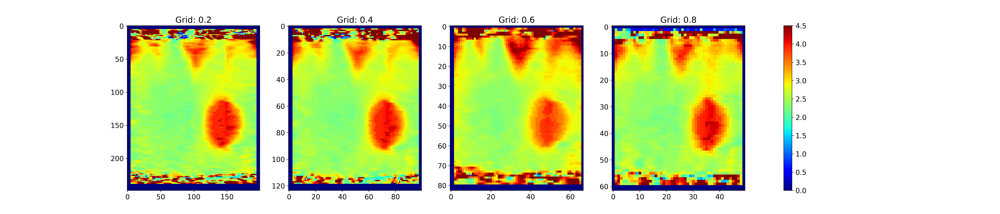

In [70]:
# Get these with different reconstruction kernel

# Plot SWS maps
#grid = [0.2, 0.25, 0.3, 0.35, 0.4]
#grid = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
grid = [0.2, 0.4, 0.6, 0.8]
datatype = 'sws'
iFactor = 5
iOrder = 2
p=10
idx = 42

# Load data
data = []
for i in grid:
    dataset = sp.io.loadmat(path + datatype + '_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '_p'+str(p)+'.mat') 
    din = dataset["data"] 
    print(din.shape)
    data.append(din)   
    
# Print
SWS_range = [0, 4.5] 
norm = plt.Normalize(SWS_range[0], SWS_range[1], True)
ax = [] * len(grid)
fig, ax = plt.subplots(1, len(grid), figsize=(28, 6))
for i in range(len(grid)):
    pcm=ax[i].imshow(data[i], cmap='jet', norm=norm)
    ax[i].set_title('Grid: ' + str(grid[i]))

fig.colorbar(pcm, ax=ax)

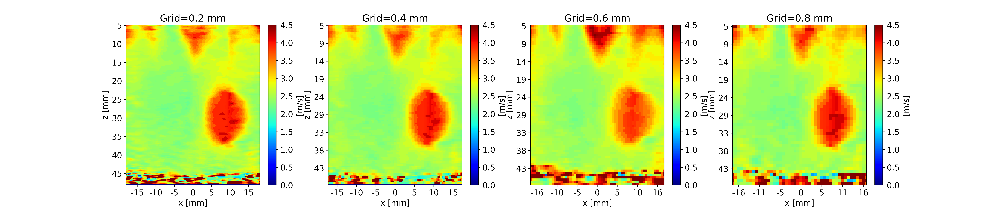

In [71]:
# Presentation for manuscript
%matplotlib widget
plt.rc("figure", dpi=400)

# Settings
# Assign ticks
y_grid = 5  #[mm] -- how to arrange ticks
x_grid = 5  #[mm]
grid_step = [0.2, 0.4, 0.6, 0.8]
norm_sws = plt.Normalize(0, 4.5, True)

# Print and format images
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(24, 5))

for i in range(4):
    z0 = int(24*0.2/grid_step[i])
    z1 = int(240*0.2/grid_step[i])
    pcm = axs[i].imshow(np.squeeze(data[i][z0:z1, :]), cmap='jet', norm=norm_sws)
    axs[i].set_title('Grid=' + str(grid_step[i]) + ' mm')
    fig.colorbar(pcm, ax=axs[i], label='[m/s]')

    im_dim = data[i][z0:z1, :].shape

    yticks  = np.arange(0, im_dim[0]-1, int(np.round(y_grid / grid_step[i]))) 
    yticks_labels = (yticks * grid_step[i]) + 5
    yticks_labels = [str(int(x)) for x in yticks_labels]

    m = int(im_dim[1]//2)
    a = np.arange(m, 0, -int(np.ceil(x_grid / grid_step[i])))
    b = np.arange(m, im_dim[1]-1, int(np.ceil(x_grid / grid_step[i])))
    xticks = np.concatenate((a[1:], b))
    xticks_labels = (xticks - m) * grid_step[i]
    xticks_labels = [str(int(x)) for x in xticks_labels]

    x0 = int(10*0.2/grid_step[i])
    x1 = int(190*0.2/grid_step[i]) 
    axs[i].set_xlim([x0,x1])    

    axs[i].set_xticks(xticks)
    axs[i].set_xticklabels(xticks_labels) 
    axs[i].set_yticks(yticks)
    axs[i].set_yticklabels(yticks_labels)

    # Set labels
    axs[i].set_xlabel('x [mm]')
    axs[i].set_ylabel('z [mm]')
    
plt.rcParams.update({'font.size': 14})

(249, 200)
(124, 100)
(83, 67)
(62, 50)


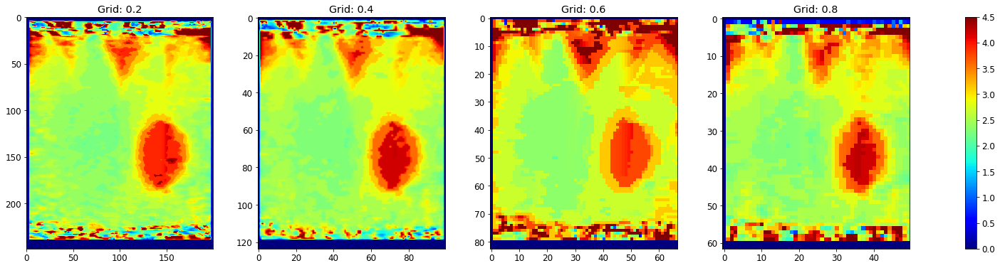

In [63]:
# Get these with different reconstruction kernel

# Plot SWS maps
#grid = [0.2, 0.25, 0.3, 0.35, 0.4]
#grid = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8]
grid = [0.2, 0.4, 0.6, 0.8]
datatype = 'sws'
iFactor = 5
iOrder = 2
p=5
idx = 42

# Load data
data = []
for i in grid:
    dataset = sp.io.loadmat(path + datatype + '_grid' + str(i) + '_iFactor' + str(iFactor) + '_iOrder' + str(iOrder) + '_id_' + str(idx) + '_p'+str(p)+'.mat') 
    din = dataset["data"] 
    print(din.shape)
    data.append(din)   
    
# Print
SWS_range = [0, 4.5] 
norm = plt.Normalize(SWS_range[0], SWS_range[1], True)
ax = [] * len(grid)
fig, ax = plt.subplots(1, len(grid), figsize=(28, 6))
for i in range(len(grid)):
    pcm=ax[i].imshow(data[i], cmap='jet', norm=norm)
    ax[i].set_title('Grid: ' + str(grid[i]))

fig.colorbar(pcm, ax=ax)

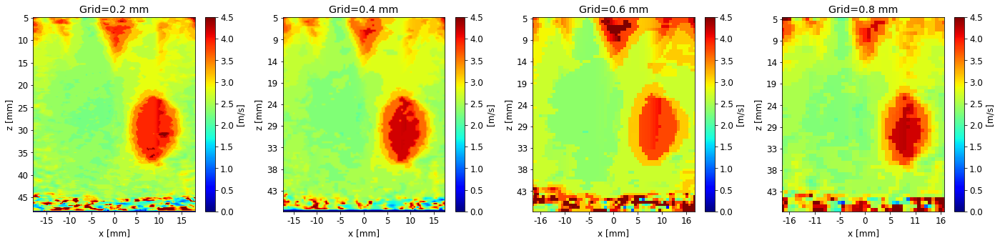

In [64]:
# Presentation for manuscript
#%matplotlib widget
#plt.rc("figure", dpi=400)

# Settings
# Assign ticks
y_grid = 5  #[mm] -- how to arrange ticks
x_grid = 5  #[mm]
grid_step = [0.2, 0.4, 0.6, 0.8]
norm_sws = plt.Normalize(0, 4.5, True)

# Print and format images
fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(24, 5))

for i in range(4):
    z0 = int(24*0.2/grid_step[i])
    z1 = int(240*0.2/grid_step[i])
    pcm = axs[i].imshow(np.squeeze(data[i][z0:z1, :]), cmap='jet', norm=norm_sws)
    axs[i].set_title('Grid=' + str(grid_step[i]) + ' mm')
    fig.colorbar(pcm, ax=axs[i], label='[m/s]')

    im_dim = data[i][z0:z1, :].shape

    yticks  = np.arange(0, im_dim[0]-1, int(np.round(y_grid / grid_step[i]))) 
    yticks_labels = (yticks * grid_step[i]) + 5
    yticks_labels = [str(int(x)) for x in yticks_labels]

    m = int(im_dim[1]//2)
    a = np.arange(m, 0, -int(np.ceil(x_grid / grid_step[i])))
    b = np.arange(m, im_dim[1]-1, int(np.ceil(x_grid / grid_step[i])))
    xticks = np.concatenate((a[1:], b))
    xticks_labels = (xticks - m) * grid_step[i]
    xticks_labels = [str(int(x)) for x in xticks_labels]

    x0 = int(10*0.2/grid_step[i])
    x1 = int(190*0.2/grid_step[i]) 
    axs[i].set_xlim([x0,x1])    

    axs[i].set_xticks(xticks)
    axs[i].set_xticklabels(xticks_labels) 
    axs[i].set_yticks(yticks)
    axs[i].set_yticklabels(yticks_labels)

    # Set labels
    axs[i].set_xlabel('x [mm]')
    axs[i].set_ylabel('z [mm]')
    
plt.rcParams.update({'font.size': 12})